# Exploración del dataset

Cada imagen ha sido etiquetada indicando que contiene alguna de estas especies:

<center>
<img src="https://storage.googleapis.com/kaggle-competitions/kaggle/5568/media/species-ref-key.jpg"/>
</center>

Fuente: [Kaggle - The Nature Conservancy Fisheries Monitoring](https://www.kaggle.com/c/the-nature-conservancy-fisheries-monitoring/data)

y existen dos categorías OTHER y NoF indicando la presencia de otras presas o que la imagen no contiene presas.

In [9]:
WORKSPACE_PATH = "/notebooks/"
WORKSPACE_DATA_PATH = WORKSPACE_PATH+"/data/"
KAGGLE_FISHERIES_DATASET = WORKSPACE_DATA_PATH+"/kaggle-fisheries/"

In [10]:
import json
import os
import shutil
import glob
import PIL
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
#from google.colab import drive

In [11]:
def display_images(class_name, image_base_path, n_samples = 16, 
                   images_per_col = 4, image_extension = "*.jpg"):
    filenames = glob.glob("%s/%s/*.jpg" % (image_base_path, class_name))
    np.random.randint(low=0, high=len(filenames), size=n_samples)
    n_cols = images_per_col
    n_rows = int(n_samples / n_cols)
    fig, axes = plt.subplots(n_rows,n_cols,figsize=(20,n_rows*4))
    for i in range(n_samples):
        ix = i % n_cols
        iy = int(i / n_cols)  
        #img = cv2.imread(filenames[i],cv2.COLOR_BGR2RGB)  
        img = PIL.Image.open(filenames[i])
        axes[iy,ix].imshow(img, interpolation='bicubic', aspect='auto')
        img_basename =  os.path.splitext(os.path.basename(filenames[i]))[0]
        axes[iy,ix].set_title(img_basename)  
        axes[iy,ix].grid(False)
    plt.suptitle(class_name)
    fig.tight_layout() 

In [12]:
IMG_TRAIN_BASE_PATH = KAGGLE_FISHERIES_DATASET+"/train/"
!ls {IMG_TRAIN_BASE_PATH}

ALB  BET  DOL  LAG  NoF  OTHER	SHARK  YFT


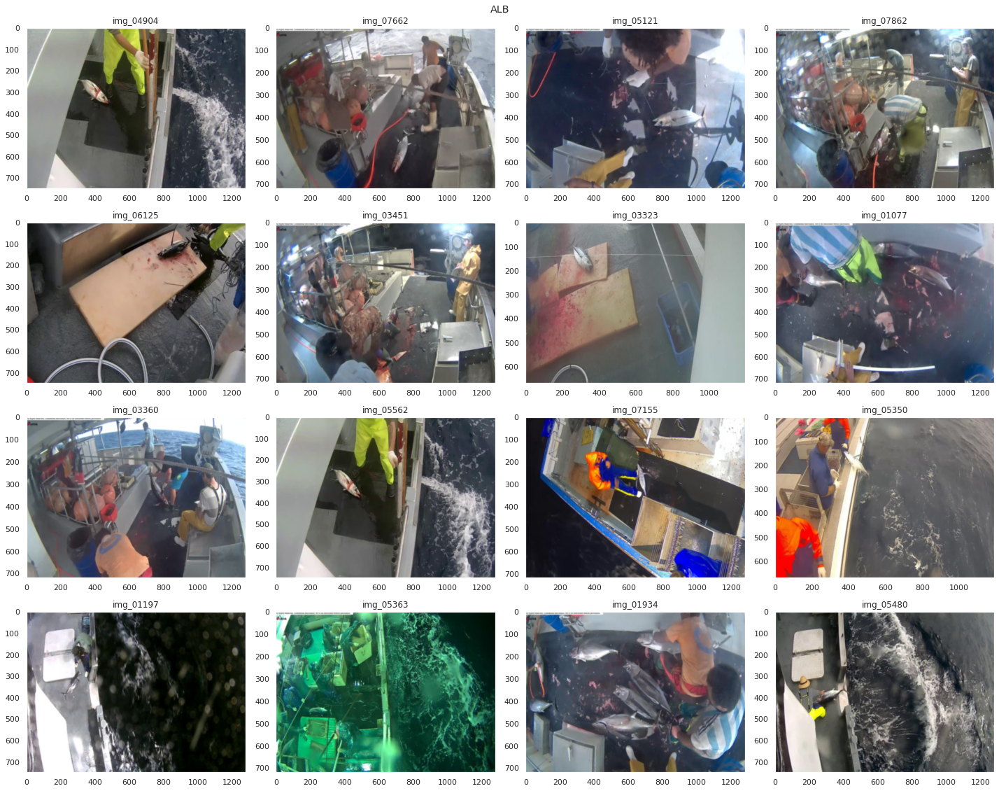

In [13]:
display_images("ALB",image_base_path=IMG_TRAIN_BASE_PATH)

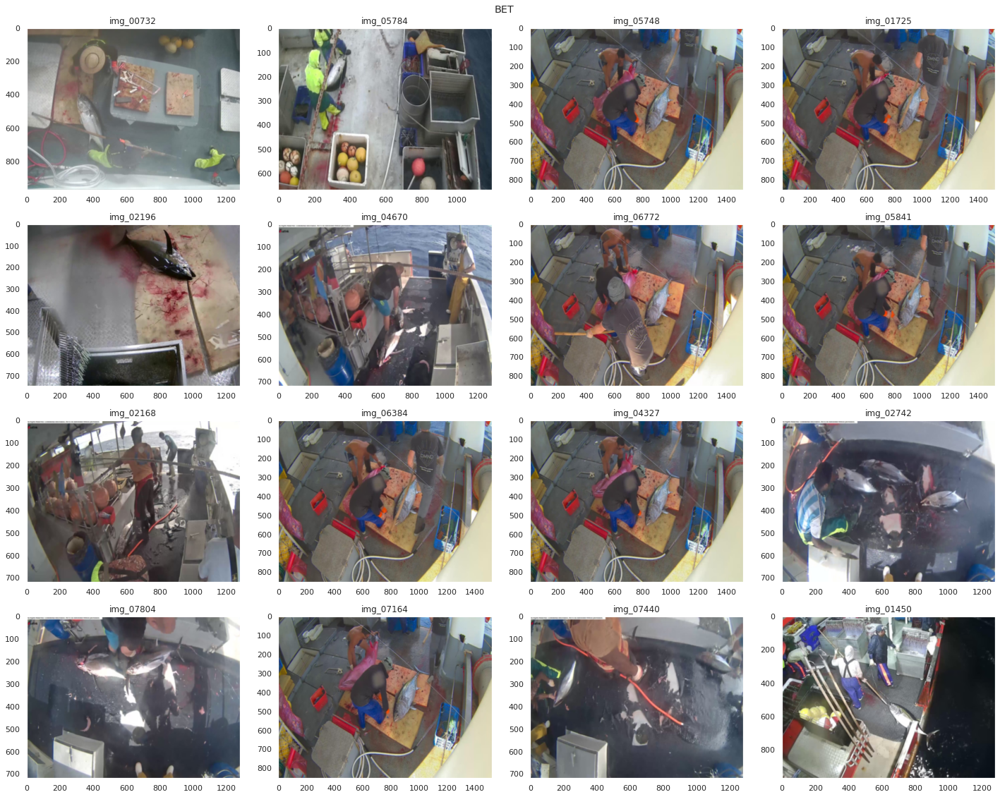

In [12]:
display_images("BET",image_base_path=IMG_TRAIN_BASE_PATH)

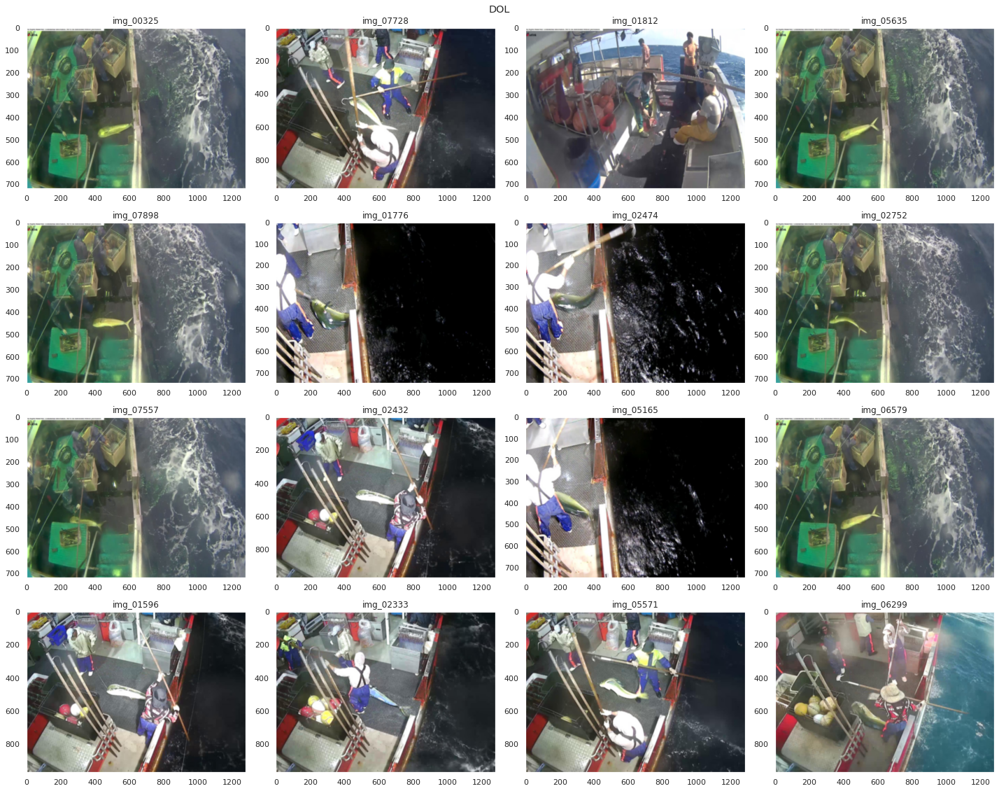

In [13]:
display_images("DOL",image_base_path=IMG_TRAIN_BASE_PATH)

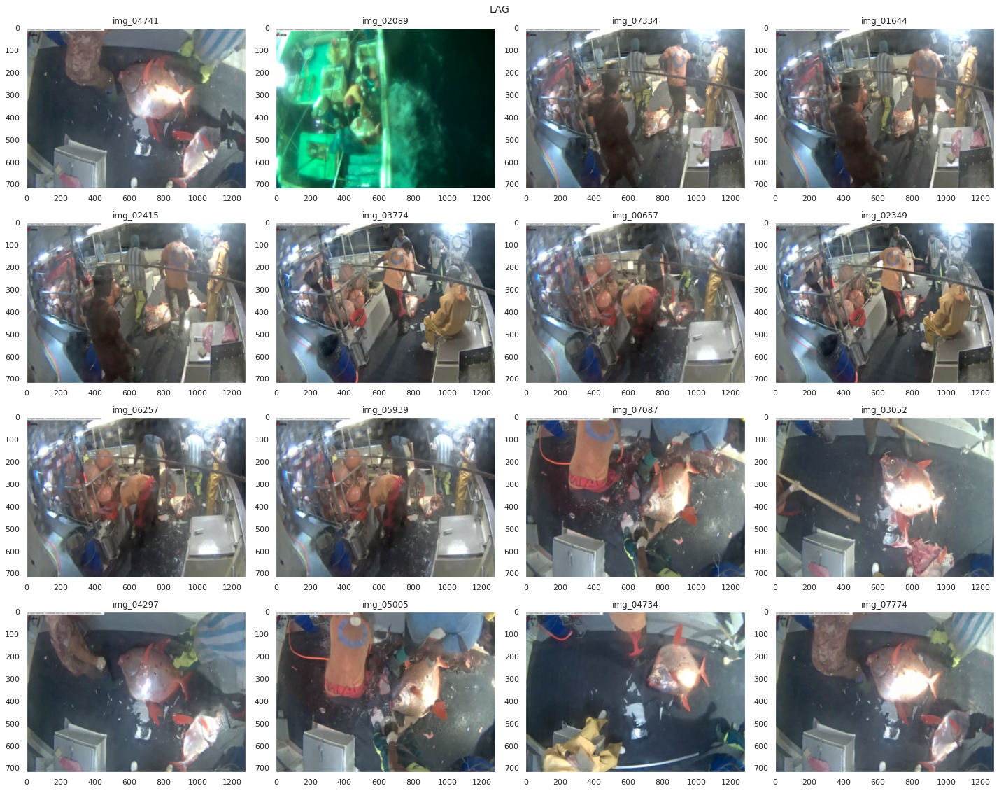

In [14]:
display_images("LAG",image_base_path=IMG_TRAIN_BASE_PATH)

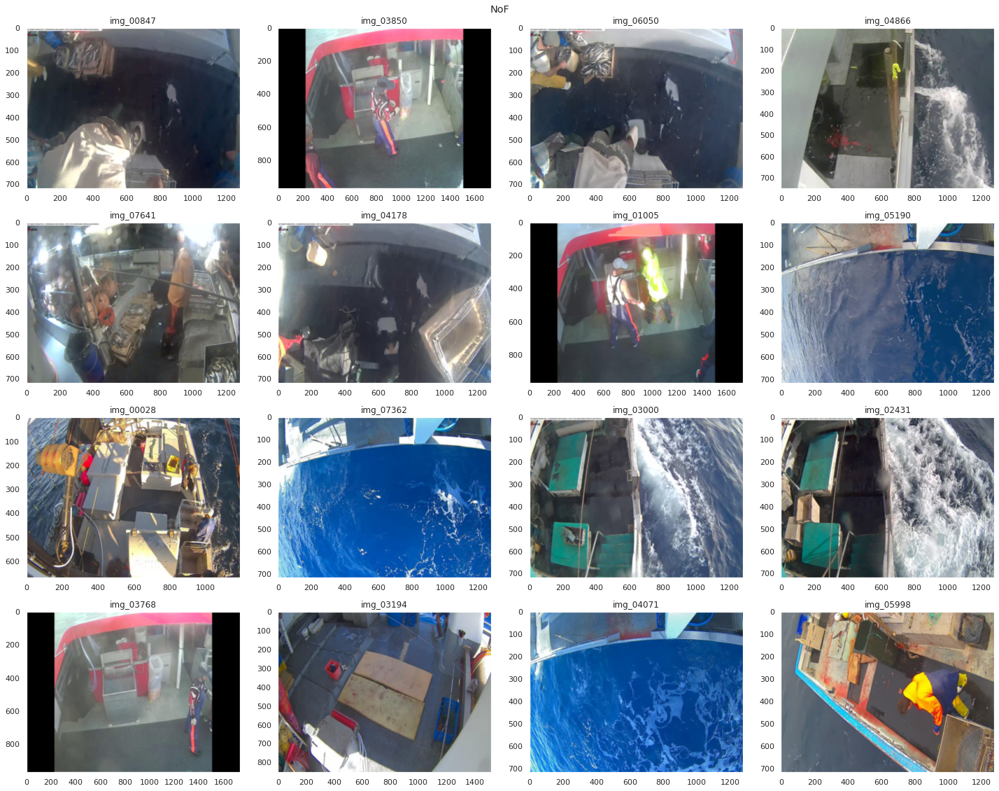

In [15]:
display_images("NoF",image_base_path=IMG_TRAIN_BASE_PATH)

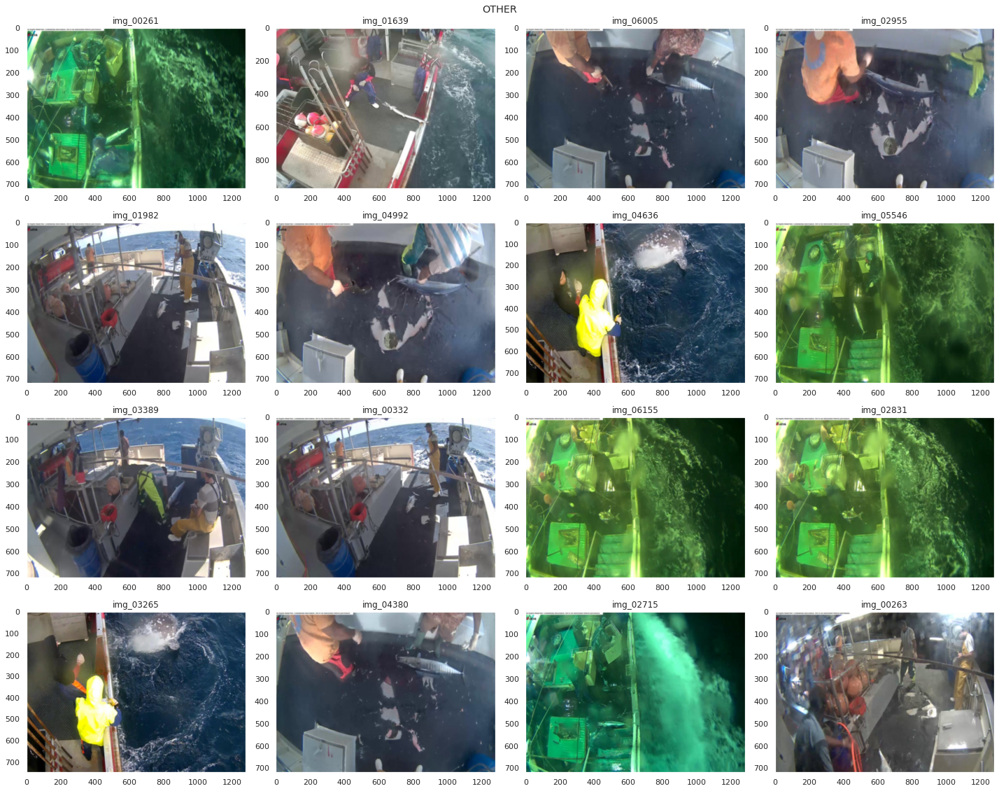

In [16]:
display_images("OTHER",image_base_path=IMG_TRAIN_BASE_PATH)

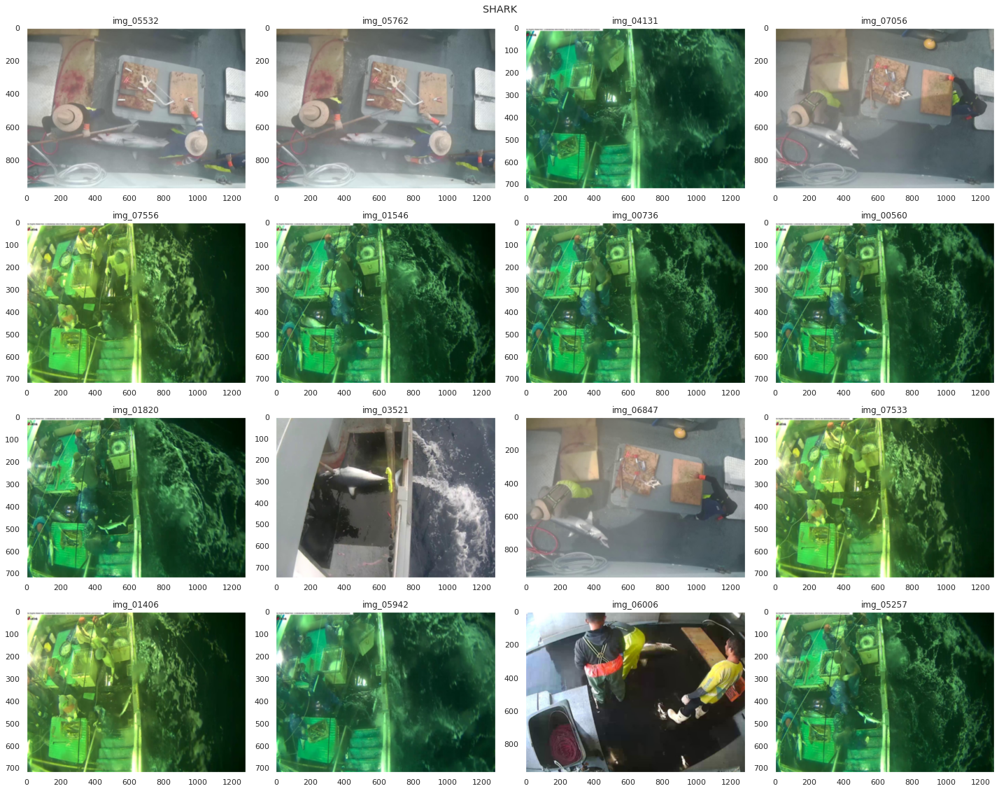

In [17]:
display_images("SHARK",image_base_path=IMG_TRAIN_BASE_PATH)

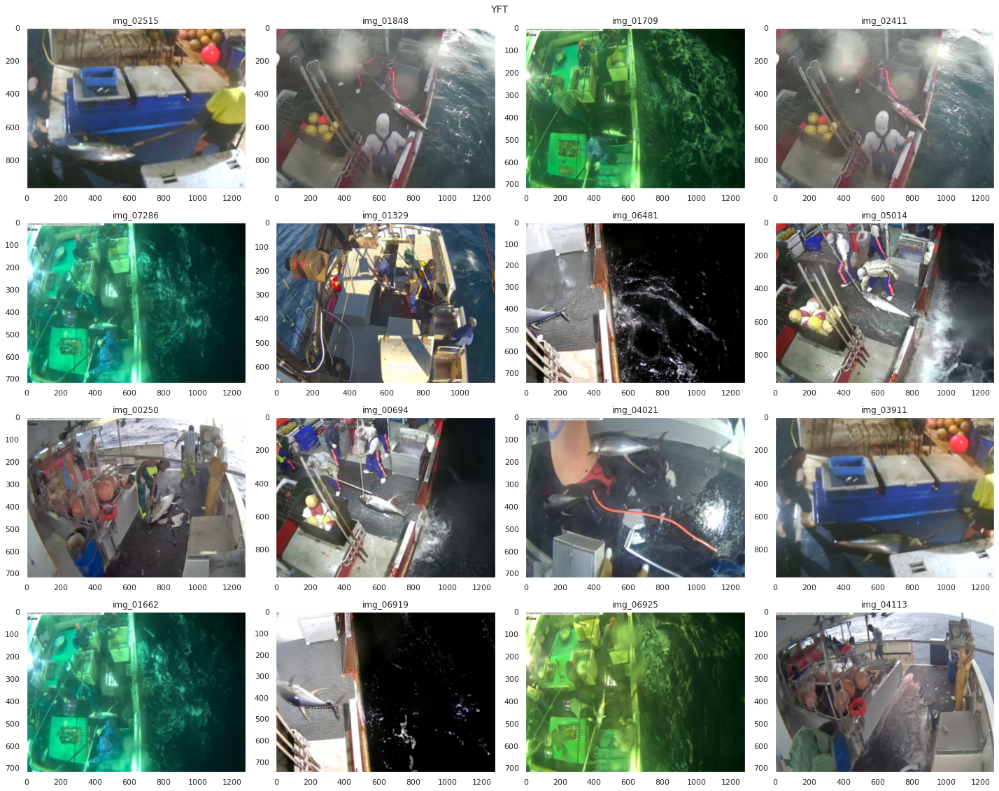

In [18]:
display_images("YFT",image_base_path=IMG_TRAIN_BASE_PATH)

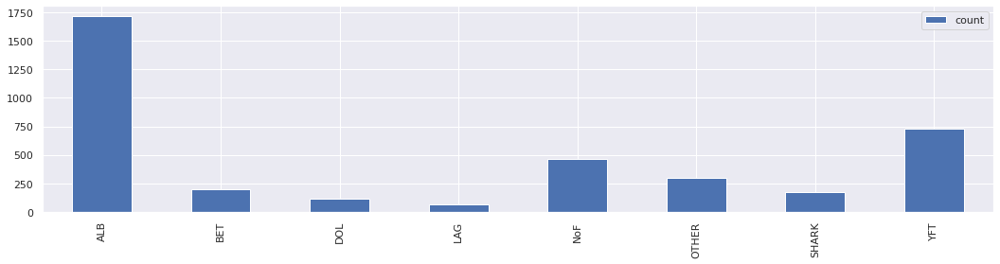

In [14]:
obj_classes = [ "ALB", "BET", "DOL", "LAG", "NoF", "OTHER", "SHARK", "YFT" ]

obj_count = {}
for o in obj_classes:  
    obj_count[o] = {"count":len(os.listdir(IMG_TRAIN_BASE_PATH+"/"+o))}
df = pd.DataFrame.from_dict(obj_count, orient='index')   
df.plot.bar(figsize=(18,4),grid=True);

In [15]:
df

,count
ALB,1719
BET,200
DOL,117
LAG,67
NoF,465
OTHER,299
SHARK,176
YFT,734


Observaciones:
- **Distribución de ejemplos**:Dataset fuertemente desbalanceado en favor de ALB.
- **Características de los ejemplos**: hay imágenes diurnas y nocturnas. Considerar:
  - Separar los ejemplos en nocturnos y diurnos, por ejemplo usando un histograma.
  - Eliminar la información de color conviritendo a otro espacio de color.
  - Agregar un nuevo feature: horario diurno-nocturno. Estudiar correlación entre horario y tipo de presa.

In [19]:
def obtain_yolov4_bbs(img_filename,class_idx,entry,preview=False):
    """Obtiene las bounding boxes de una entrada de JSON y genera un string
       en formato YOLOv4 (Darknet) y devuelve una lista con las BBs.
    """
    yolo_str = ""  
    pil_img = PIL.Image.open(img_filename)   
    img = np.array(pil_img)
    img_w = img.shape[1]
    img_h = img.shape[0]
    boxes = []
    for bb in entry['annotations']:
        x = int(bb['x'])
        y = int(bb['y'])
        w = int(bb['width'])
        h = int(bb['height'])
        xc = (2*x+w)/2
        yc = (2*y+h)/2

        # Yolo (norm)
        xc_norm = xc / img_w
        yc_norm = yc / img_h
        w_norm = w / img_w
        h_norm = h / img_h

        boxes.append({
            "class": class_idx,
            "xc": xc_norm,
            "yc": yc_norm,
            "w": w_norm,
            "h": h_norm
        })

        if preview:        
            img = cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (0,255,0), 2)
            img = cv2.circle(img, (int(xc), int(yc)), 10,(0,255,0))

        yolo_str+= "%d %f %f %f %f" % (class_idx, xc_norm,yc_norm,w_norm,h_norm) + os.linesep

    if preview:
        fig,axes = plt.subplots(figsize=(16,8))
        axes.imshow(img, interpolation='bicubic', aspect='auto');
        axes.grid(False)
    return yolo_str,boxes

In [21]:
JSON_BOUNDING_BOXES_PATH = KAGGLE_FISHERIES_DATASET+"/kaggle-ncfm/"
class_labels={
    "alb": {
        "class_idx": 0,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"alb_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/ALB"
    },
    "bet": {
        "class_idx": 1,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"bet_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/BET"
    },
    "dol": {
        "class_idx": 2,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"dol_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/DOL"
    },
    "lag": {
        "class_idx": 3,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"lag_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/LAG"
    },
    "shark": {
        "class_idx": 4,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"shark_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/SHARK"
    },
    "yft": {
        "class_idx": 5,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"yft_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/YFT"
    },
    "other": {
        "class_idx": 6,
        "bb_filename": JSON_BOUNDING_BOXES_PATH+"other_labels.json",
        "train_img": IMG_TRAIN_BASE_PATH+"/OTHER"
    },
    
    #"nof": {
    #        "class_idx": 7,
    #    "bb_filename": JSON_BOUNDING_BOXES_PATH+"other_labels.json",
    #    "train_img": IMG_TRAIN_BASE_PATH+"/NoF"
    #}
}

0 0.576953 0.372917 0.299219 0.209722



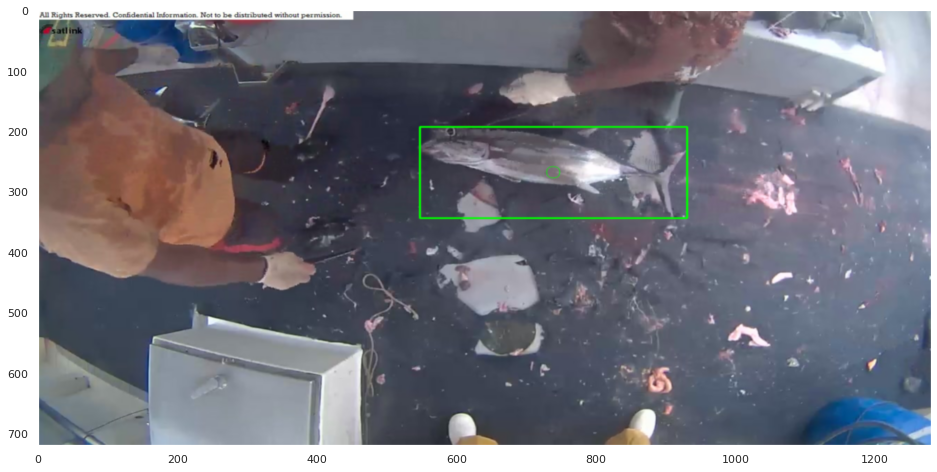

In [22]:
with open(class_labels['alb']['bb_filename']) as f:
    alb_labels = json.load(f)

entry = alb_labels[0]
img_filename = "%s/%s/%s" % (IMG_TRAIN_BASE_PATH,"ALB", entry['filename'])
yolo_bb_str, _ = obtain_yolov4_bbs(img_filename,0,entry,preview=True)
print(yolo_bb_str)